In [7]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from matplotlib import cm
import seaborn as sns

#### Import data

In [8]:
data = pd.read_csv('abalone.csv')

In [9]:
data = data.replace({'?': np.nan,
                    "#VALUE!": np.nan,
                    '#DIV/0!': np.nan})
data['Length'] = data['Length'].astype(float)
data['Whole weight'] = data['Whole weight'].astype(float)
data['BMI'] = data['BMI'].astype(float)

#### Pandas Profiling Report

In [10]:
# data_prof = ProfileReport(data)
# data_prof.to_file(output_file='data_profile.html')

#### Generate Histograms

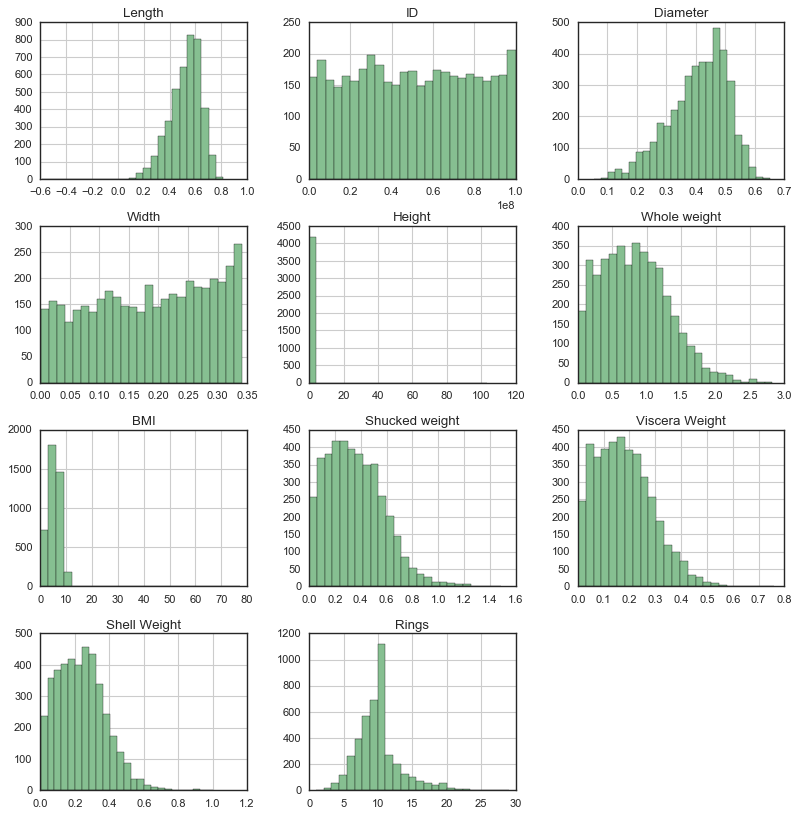

In [21]:
plt.style.use('seaborn-white')
data_hist = data[['Length', 'ID', 'Diameter', 'Width', 'Height',
       'Whole weight', 'BMI', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'Rings']]
data_hist.hist(figsize=(12,12), color='#86bf91', zorder=2, bins=25)
plt.savefig('images/01 all features hist before.png',bbox_inches = 'tight');

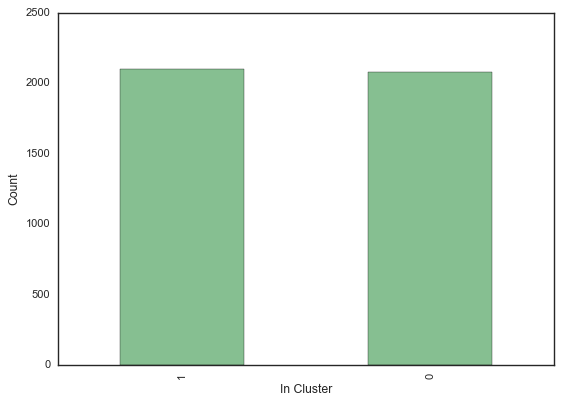

In [22]:
data['In Cluster'].value_counts().plot(kind="bar", color='#86bf91')
plt.xlabel('In Cluster', labelpad=None)
plt.ylabel('Count', labelpad=None)
plt.savefig('images/02 in cluster hist before.png',bbox_inches = 'tight');

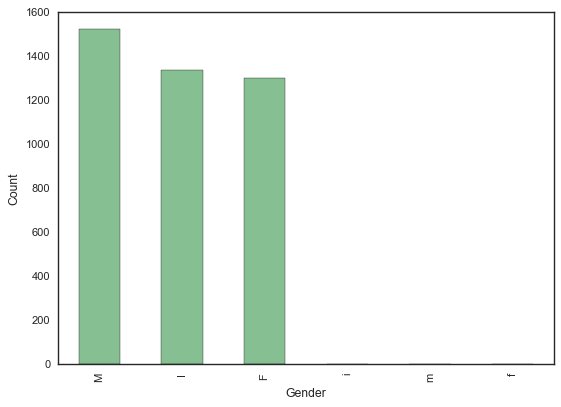

In [23]:
data['Gender'].value_counts().plot(kind='bar', color='#86bf91')
plt.xlabel('Gender', labelpad=None)
plt.ylabel('Count', labelpad=None)
plt.savefig('images/03 gender hist before.png',bbox_inches = 'tight');

#### Create feature relationship plots

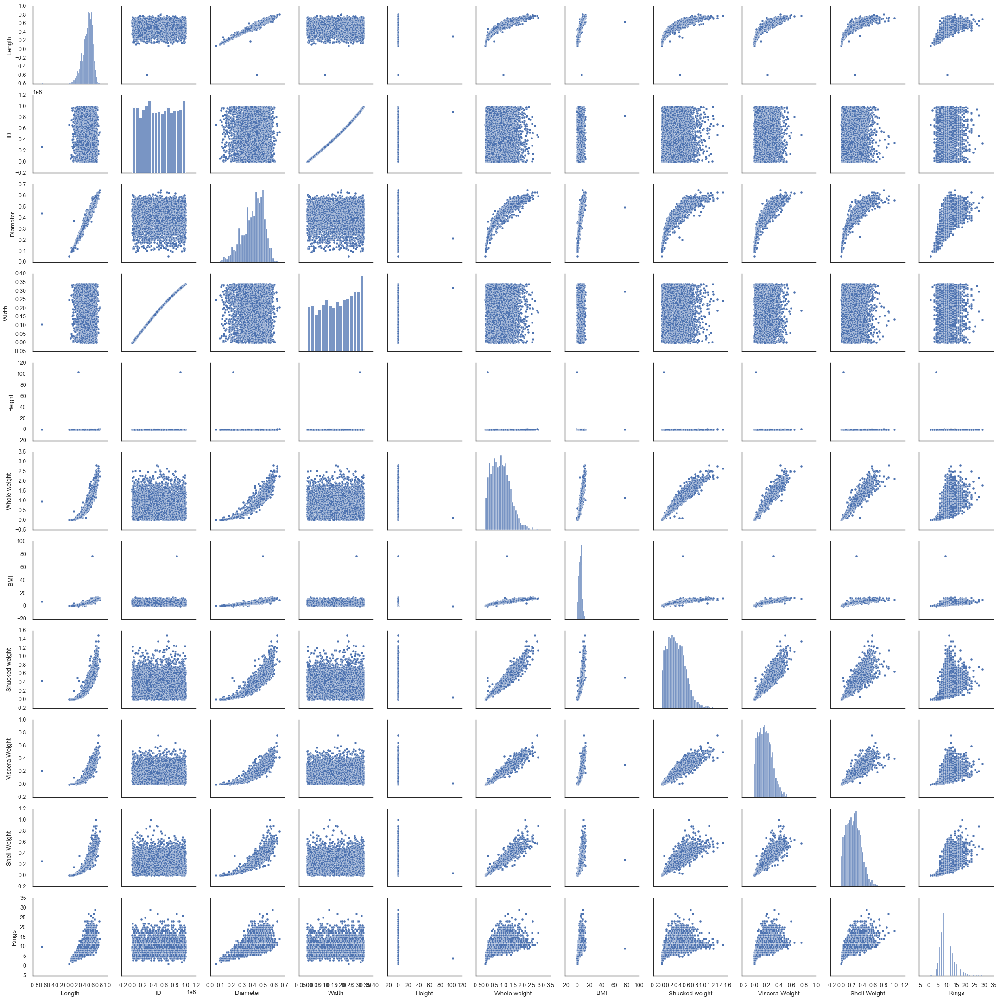

In [24]:
sns.set_theme(style="white")
sns.pairplot(data[['Length', 'ID', 'Diameter', 'Width', 'Height',
       'Whole weight', 'BMI', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'Rings']])
plt.savefig('images/03 splom before.png',bbox_inches = 'tight');

#### Data Cleaning

In [25]:
data = data.replace({'Gender': {'i': 'I',
                                'm': 'M',
                                'f' : 'F'}})

In [26]:
data['Gender'] = data['Gender'].fillna(data['Gender'].mode()[0])

In [27]:
bmi_missing = list(data[data['BMI'].isna()].index)
length_missing = list(data[data['Length'].isna()].index)
ww_missing = list(data[data['Whole weight'].isna()].index)
missing = bmi_missing + length_missing + ww_missing

In [28]:
data_before = data.loc[missing,:]

In [29]:
# data_prof_after = ProfileReport(data)

#### Sort out Outliers

In [30]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
cols = ['Length', 'Diameter', 'Width', 'Height',
       'Whole weight', 'BMI', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'Rings']
data[cols] = imputer.fit_transform(data[cols])

In [31]:
data.loc[data['Height'].idxmax(),'Height'] = np.nan
data[cols] = imputer.fit_transform(data[cols])

In [32]:
remove0 = list(data[(data['BMI'] <= np.percentile(data['BMI'], 0.001)) | (data['BMI'] >= np.percentile(data['BMI'], 99.95))].index)
remove1 = list(data[(data['Length'] <= np.percentile(data['Length'], 0.001)) | (data['Length'] >= np.percentile(data['Length'], 99.95))].index)
remove2 = list(data[(data['Height'] <= np.percentile(data['Height'], 0.001)) | (data['Height'] >= np.percentile(data['Height'], 99.95))].index)
remove3 = list(data[data['Rings'] >= np.percentile(data['Rings'], 99.95)].index)

In [33]:
remove_idx = remove0+ remove1+ remove2 + remove3

In [34]:
data = data[data.index.isin(remove_idx) == False]

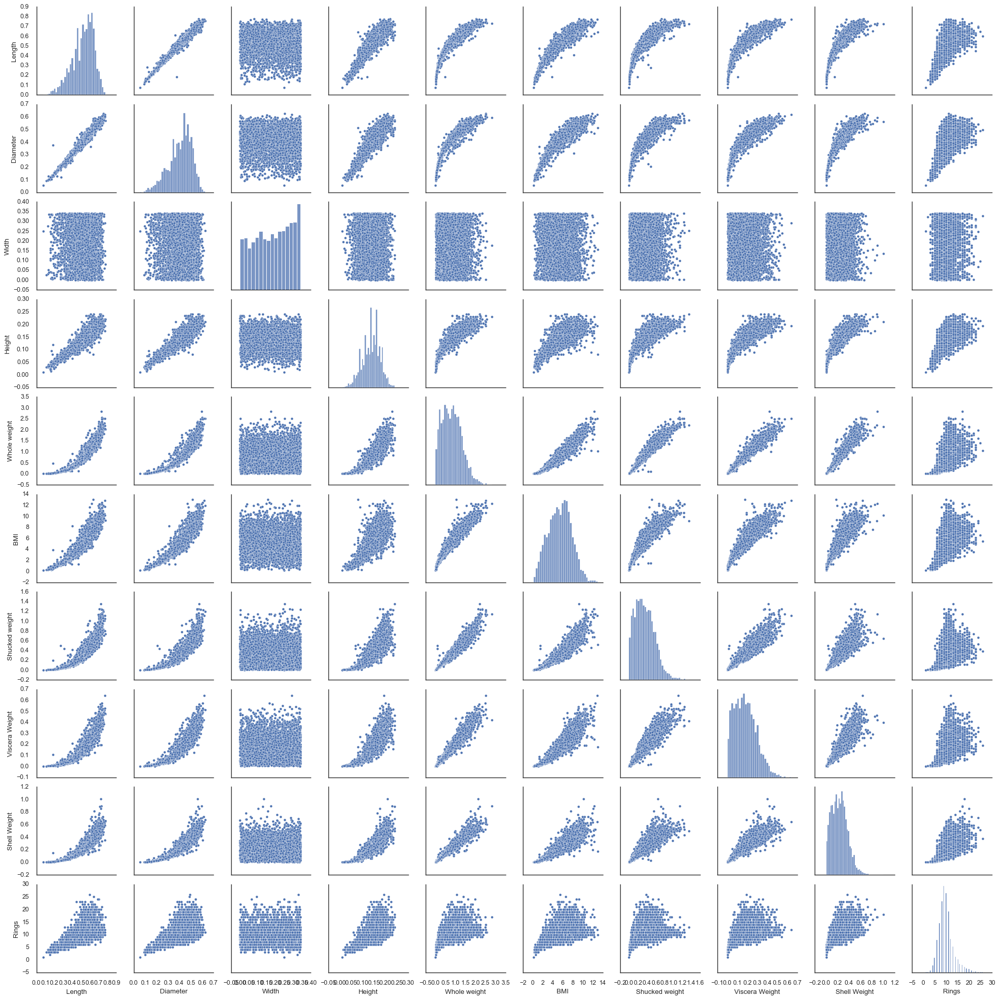

In [35]:

sns.pairplot(data[['Length', 'Diameter', 'Width', 'Height',
       'Whole weight', 'BMI', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'Rings']])
plt.savefig('images/04 splom after.png',bbox_inches = 'tight');

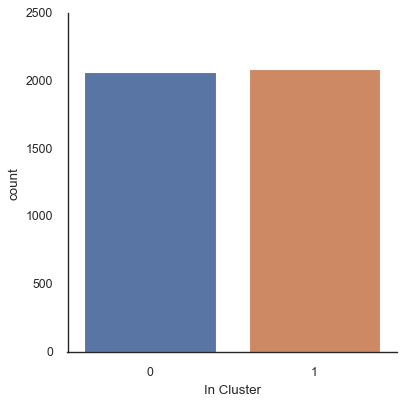

In [36]:
sns.catplot(x='In Cluster',
            data=data,
            kind='count');
plt.savefig('images/05 In Cluster Bar.png',bbox_inches = 'tight');

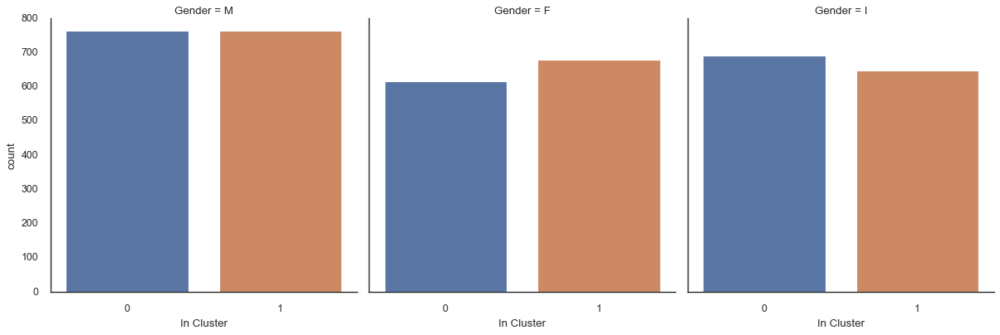

In [37]:
sns.catplot(x='In Cluster',
            data=data,
            kind='count',
            col="Gender");
plt.savefig('images/06 In Cluster Bars.png',bbox_inches = 'tight');

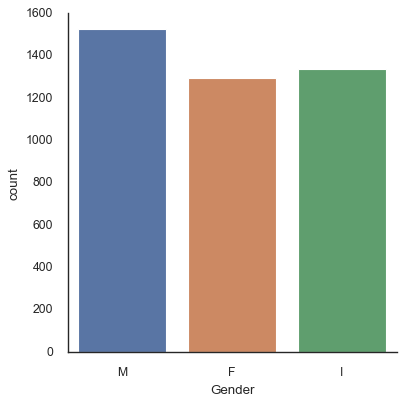

In [38]:
sns.catplot(x='Gender',
            data=data,
            kind='count');
plt.savefig('images/07 Gender Bar.png',bbox_inches = 'tight');

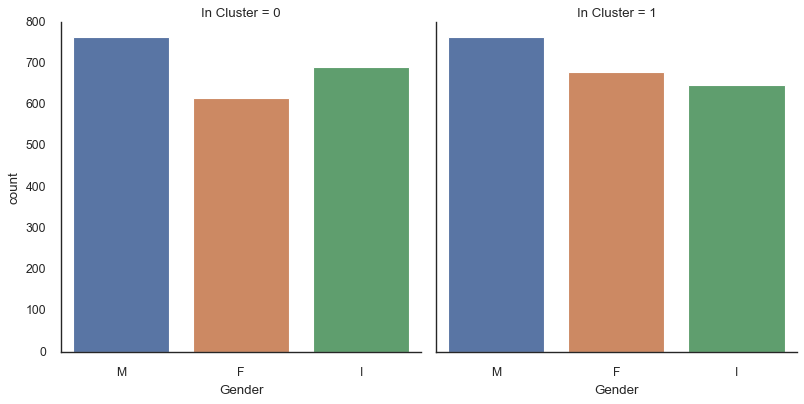

In [39]:
sns.catplot(x='Gender',
            data=data,
            kind='count',
            col="In Cluster");
plt.savefig('images/08 Gender Bars.png',bbox_inches = 'tight');

In [40]:
cont_cols = ['Length', 'Diameter', 'Width', 'Height',
       'Whole weight', 'BMI', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'Rings']

In [44]:
sns.set_theme(style="whitegrid")
i = 9
for var in cont_cols:

    sns.catplot(x="In Cluster", y=var, data=data, kind="violin")
    file_path = 'images/0' + str(i) + ' In Cluster vs. ' + var + '.png'
    plt.savefig(file_path,bbox_inches = 'tight');
    i = i + 1

In [45]:
sns.set_theme(style="whitegrid")
i = 19
for var in cont_cols:

    sns.catplot(x="Gender", y=var, data=data, kind="violin")
    file_path = 'images/0' + str(i) + ' Gender vs. ' + var + '.png'
    plt.savefig(file_path,bbox_inches = 'tight');
    i = i + 1

#### Covariance Matrix

In [48]:
data['In Cluster'] = data['In Cluster'].astype('category')
data.corr().to_csv('cor_matrix.csv')

In [49]:
data['In Cluster'] = data['In Cluster'].astype('category')
data.cov().to_csv('cov_matrix.csv')

In [75]:
import scipy.stats as stats

stats.f_oneway(data['Rings'][data['In Cluster'] == 0],
               data['Rings'][data['In Cluster'] == 1])

F_onewayResult(statistic=0.6512161058706553, pvalue=0.41972439260098504)

In [77]:
f_score, p_value = stats.f_oneway(data['Rings'][data['Gender'] == 'M'],
               data['Rings'][data['Gender'] == 'F'],
               data['Rings'][data['Gender'] == 'I'])

In [83]:
anova = pd.DataFrame(columns=['feature', 'f_score', 'p_value'])
i = 0
for col in cont_cols:
    
    f_score, p_value = stats.f_oneway(data[col][data['Gender'] == 'M'],
                                      data[col][data['Gender'] == 'F'],
                                      data[col][data['Gender'] == 'I'])
    
    anova.loc[i,'feature'] = col
    anova.loc[i,'f_score'] = f_score
    anova.loc[i,'p_value'] = p_value
    
    i=i+1
    
anova.to_csv('anova.csv')

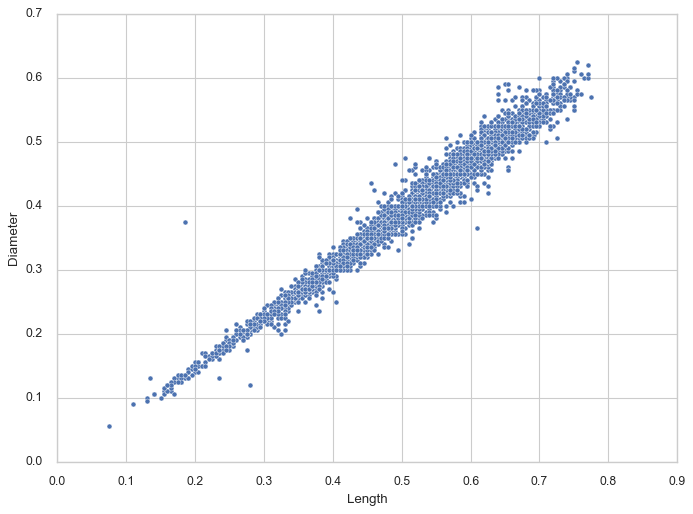

In [68]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x="Length", y="Diameter", data=data)
plt.savefig('images/029 Length Diameter Scatter.png',bbox_inches = 'tight');

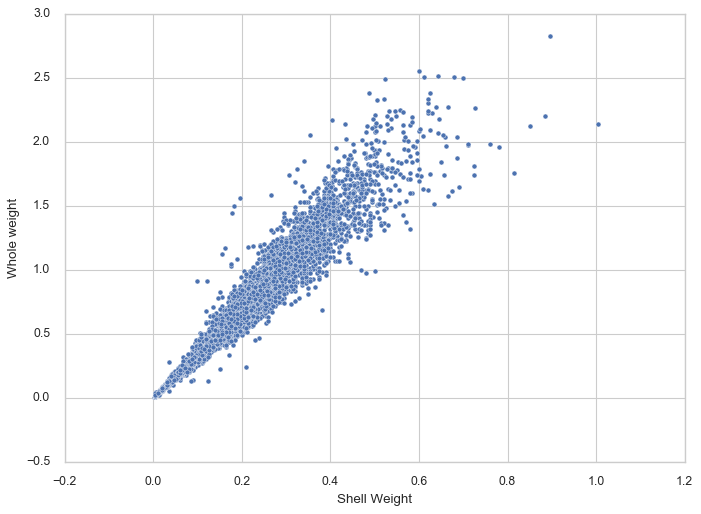

In [69]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x="Shell Weight", y='Whole weight', data=data)
plt.savefig('images/030 Shell Weight Whole weight Scatter.png',bbox_inches = 'tight');

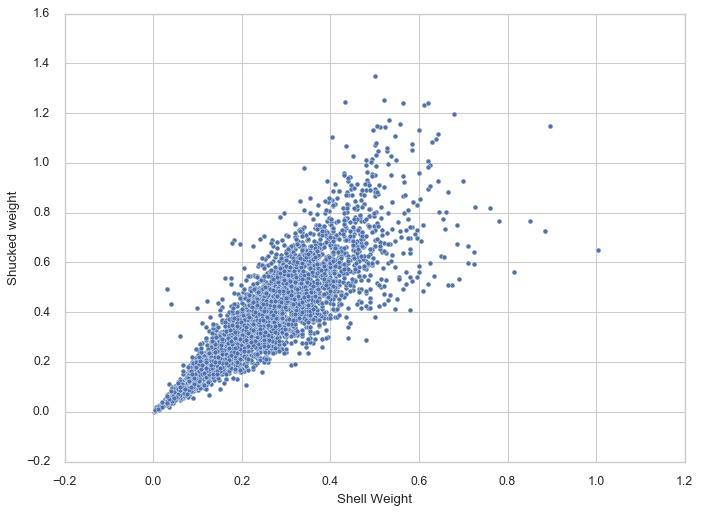

In [70]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x="Shell Weight", y='Shucked weight', data=data)
plt.savefig('images/031 Shell Weight Shucked weight Scatter.png',bbox_inches = 'tight');

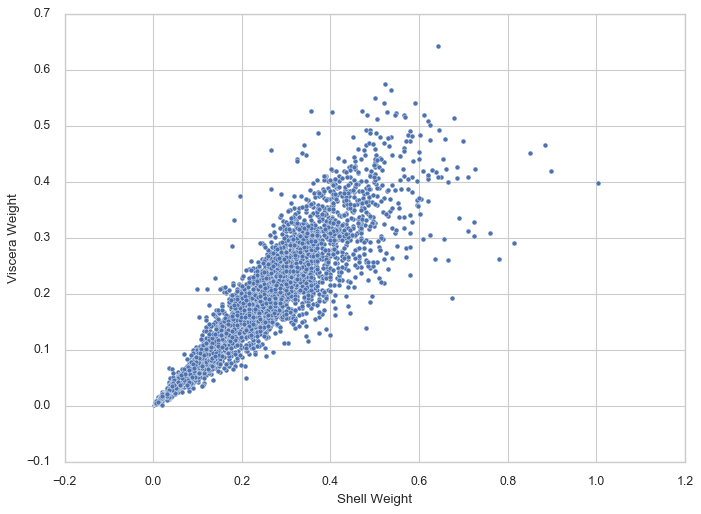

In [71]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x="Shell Weight", y= 'Viscera Weight', data=data)
plt.savefig('images/032 Shell Weight Viscera weight Scatter.png',bbox_inches = 'tight');

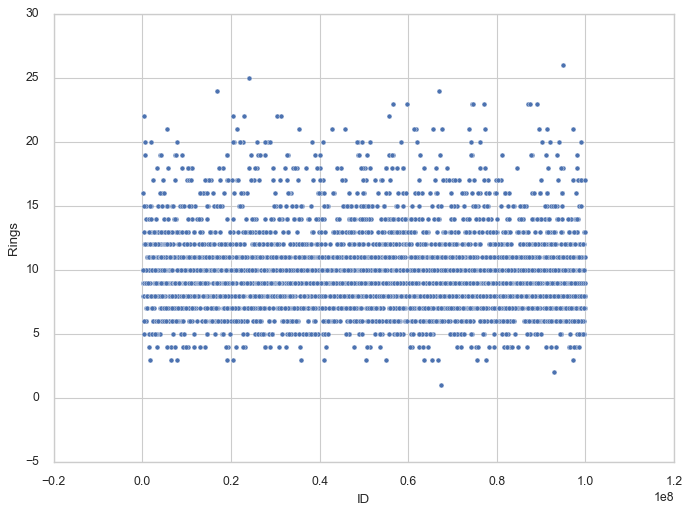

In [72]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x="ID", y= 'Rings', data=data)
plt.savefig('images/033 ID Rings Scatter.png',bbox_inches = 'tight');

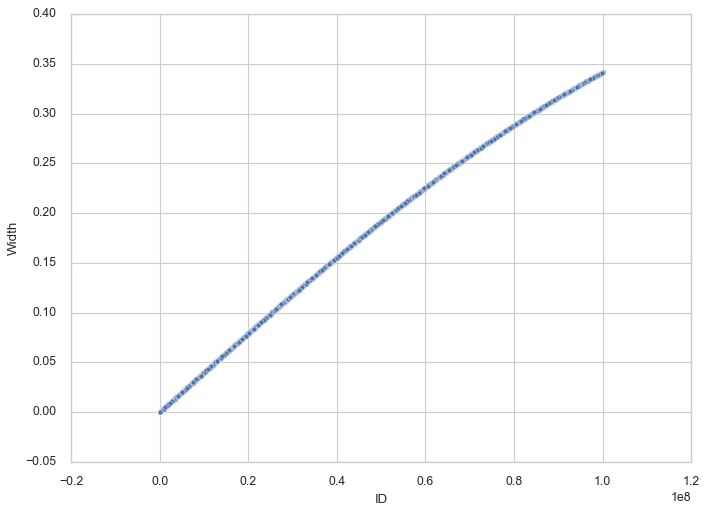

In [74]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x="ID", y= 'Width', data=data)
plt.savefig('images/034 Width Rings Scatter.png',bbox_inches = 'tight');

In [97]:
data_scaled = data.copy()

In [98]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

data_scaled[cont_cols] = scaler.fit_transform(data_scaled[cont_cols])

In [99]:
data_scaled = data_scaled.drop('ID', axis=1)

In [89]:
pp_plot_1_cols = ['Gender', 'Length', 'Diameter', 'Height',
       'Whole weight', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'BMI', 'Rings']

pp_plot_2_cols = ['In Cluster', 'Length', 'Diameter', 'Height',
       'Whole weight', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'BMI', 'Rings']

pp_plot_3_cols = ['Length', 'Diameter', 'Height',
       'Whole weight', 'Shucked weight', 'Viscera Weight',
       'Shell Weight', 'BMI', 'Rings']

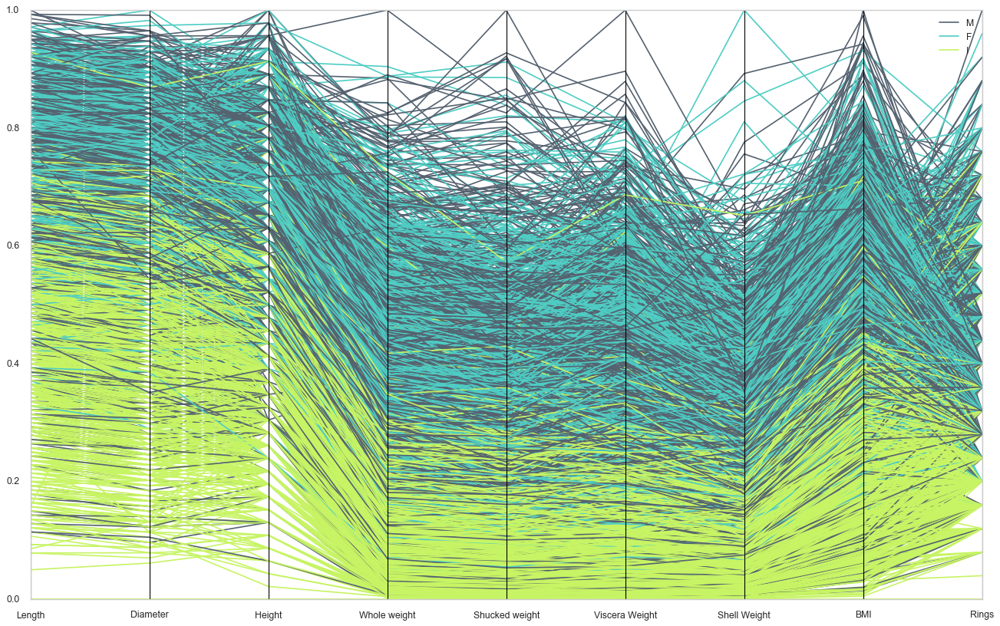

In [90]:
plt.figure(figsize=(20, 12))
pd.plotting.parallel_coordinates(data_scaled[pp_plot_1_cols], 'Gender',color=('#556270', '#4ECDC4', '#C7F464'))
plt.legend(loc=1,bbox_to_anchor=(1, 1),fancybox =1, shadow =True, framealpha =0.8)
plt.savefig('images/037 Parallel Gender.png',bbox_inches = 'tight');

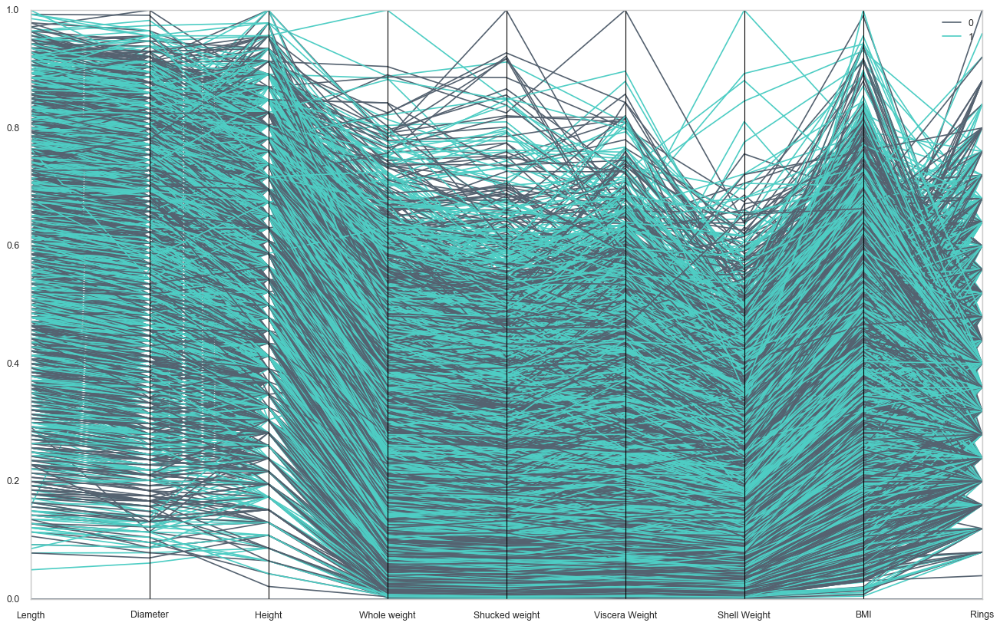

In [91]:
plt.figure(figsize=(20, 12))
pd.plotting.parallel_coordinates(data_scaled[pp_plot_2_cols], 'In Cluster',color=('#556270', '#4ECDC4', '#C7F464'))
plt.legend(loc=1,bbox_to_anchor=(1, 1),fancybox =1, shadow =True, framealpha =0.8)
plt.savefig('images/035 Parallel In Cluster.png',bbox_inches = 'tight');

In [100]:
data_scaled['Rings'] = data_scaled['Rings'].round(decimals=2)

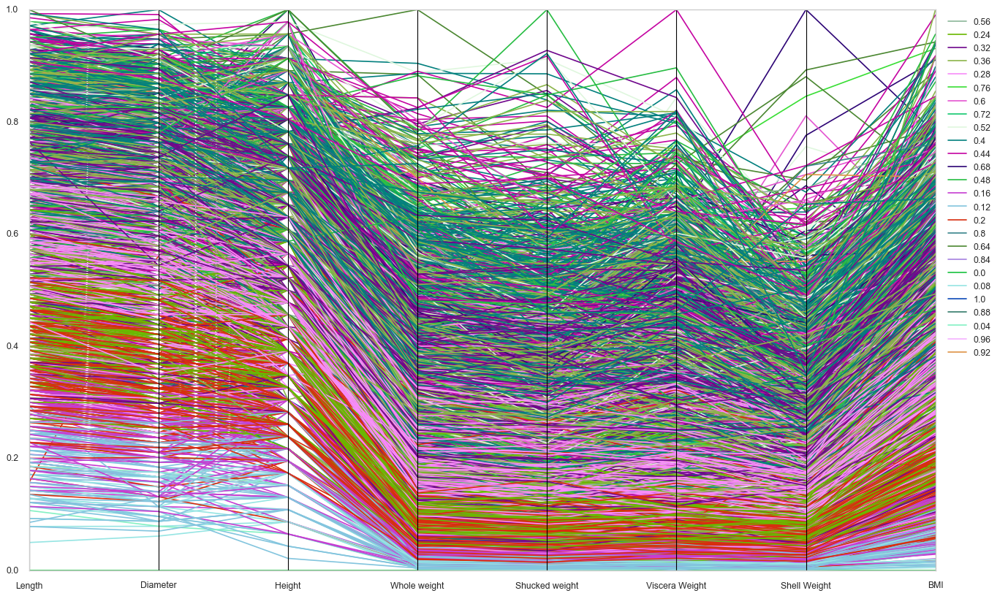

In [104]:
plt.figure(figsize=(20, 12))
pd.plotting.parallel_coordinates(data_scaled[pp_plot_3_cols], 'Rings')
plt.legend(loc=1,bbox_to_anchor=(1.07, 1))
plt.savefig('images/038 Parallel Rings.png',bbox_inches = 'tight');

In [ ]:
data['Height'].value_counts()

In [ ]:
sns.set_theme(style="whitegrid")
i = 9
for var in cont_cols:

    sns.boxplot(x="In Cluster", y=var, data=data);
    file_path = 'images/0' + str(i) + ' In Cluster Boxes.png'
    plt.savefig(file_path,bbox_inches = 'tight');
    i = i + 1

In [ ]:
data.columns

F_onewayResult(statistic=499.77754712557766, pvalue=3.158068712836574e-195)